In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/omdena-naturewise/cases_monthly_naturewise.json
/kaggle/input/omdena-naturewise/df2010.csv
/kaggle/input/omdena-naturewise/df2018.csv
/kaggle/input/omdena-naturewise/df2019.csv
/kaggle/input/omdena-naturewise/df2020.csv
/kaggle/input/omdena-naturewise/df2000.csv
/kaggle/input/omdena-naturewise/df2017.csv
/kaggle/input/omdena-naturewise/naturewise_formatted.csv


# Ignore the first few cells
## These cells were used to extract,format data for desired features. You may look into them. For EDA, jump to the 'EDA Start' cell

In [2]:
df = pd.read_json('/kaggle/input/omdena-naturewise/cases_monthly_naturewise.json')
total_recs = df.iloc[-2]
df = df.iloc[1:-2]
df = df.T
df.columns = df.iloc[0]
df.columns.to_list()
df = df.iloc[1:]

In [3]:
# df.to_csv('naturewise_formatted.csv')
# df = pd.read_csv('/kaggle/input/omdena-naturewise/naturewise_formatted.csv')

In [4]:
try:
    df.columns.to_list()
    new_cols=[]
    for x in df.columns:
        new_cols.append(x.replace('/','or'))
    df.columns=new_cols
except AttributeError:
    pass

In [5]:
try:
    for i in range(len(list(df.columns))):
        if df.columns[i]==None:
            df.drop([df.columns[i]],axis=1,inplace=True)
except IndexError:
    pass

In [6]:
df

Nature,Bigamy / Polygamy,Dowry Death,Dowry Harassment / Cruelty to married women,Gender Discrimination including equal right to education & work,Harassment At Workplace,Kidnapping / Abduction,Maintenance Claim,Miscellaneous,Murder,Outraging Modesty of Women,...,Right to live with dignity,Right to live with dignity,Sex selective abortion / female foeticide / amniocentesis,Sexual harassment including sexual harassment at workplace,Sexual Harassment of Women at workplace,Stalking / Voyeurism,"Traditional practices derogatory to women rights i.e. sati pratha, devdasi pratha, witch hunting",Trafficking / Prostitution of women,Violence against women,Women's right of custody of children in the event of divorce
Jan,7,36,63,1,70,4,1,76,19,4,...,450,0,2,44,0,9,6,3,92,2
Feb,6,23,62,0,92,12,0,102,19,3,...,722,1,6,70,0,21,1,8,143,9
Mar,12,25,84,0,116,18,0,101,18,1,...,658,0,4,102,0,11,2,18,211,2
Apr,10,24,59,0,109,11,1,59,6,0,...,876,1,3,112,0,19,0,21,270,3
May,14,64,121,0,161,16,2,78,27,0,...,859,0,2,71,0,7,1,8,210,9
Jun,9,25,57,1,71,8,1,34,13,0,...,633,2,3,96,1,14,1,4,185,3
Jul,7,64,103,0,140,18,0,76,26,0,...,457,0,2,53,0,6,0,6,137,5
Aug,10,73,115,0,211,19,1,121,29,0,...,529,0,8,77,0,10,4,14,160,6
Sep,9,50,102,0,137,15,1,113,32,0,...,462,1,5,56,0,11,1,7,126,6
Oct,13,63,88,0,149,16,0,73,20,0,...,471,0,9,87,0,23,3,5,120,4


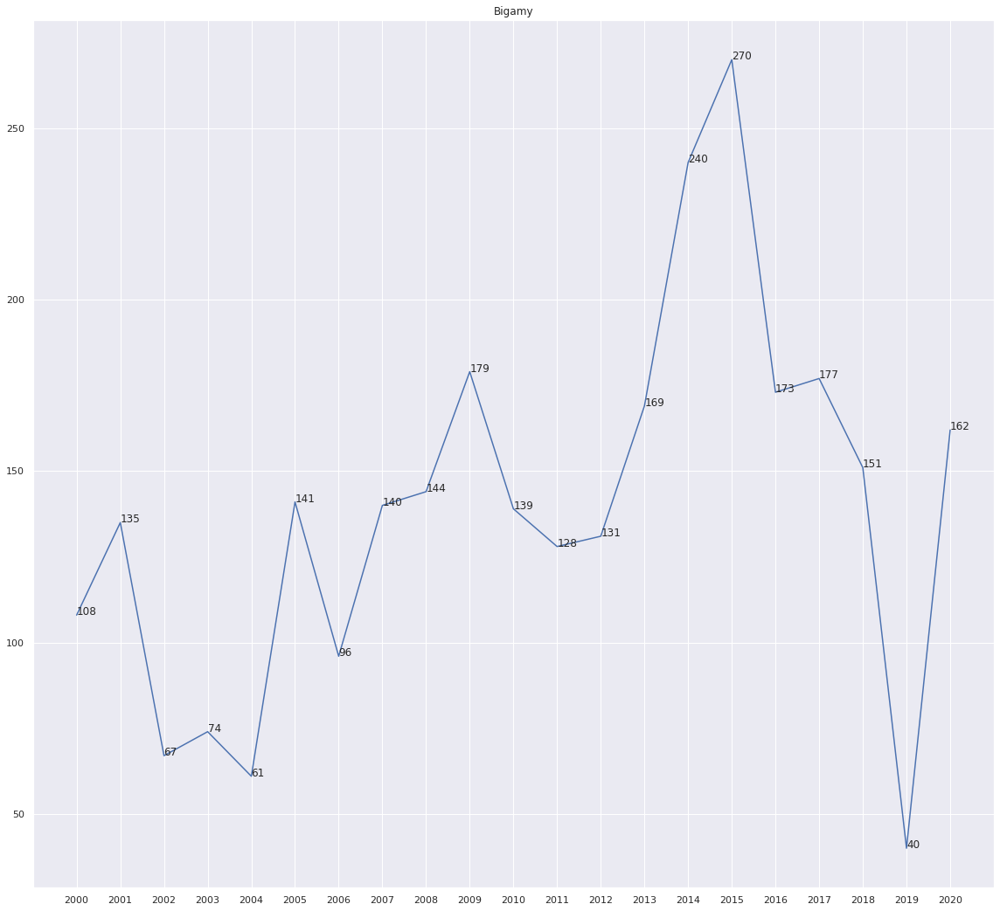

In [7]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

y = df[df.columns[0]].iloc[-2].apply(int)
x = df[df.columns[0]].iloc[-1].apply(int).to_list()
x.sort()


sns.set(rc={'figure.figsize':(19.7,18.27)})

ax = plt.figure().add_subplot(111)
for i,j in zip(x,y):
    ax.annotate(str(j),xy=(i,j))

# sns.lineplot(x=x,y=y)
plt.plot(x,y)
plt.xticks(np.arange(min(x), max(x)+1, 1.0))
plt.title('Bigamy')








plt.show()



AttributeError: 'str' object has no attribute 'apply'

<Figure size 1418.4x1315.44 with 0 Axes>

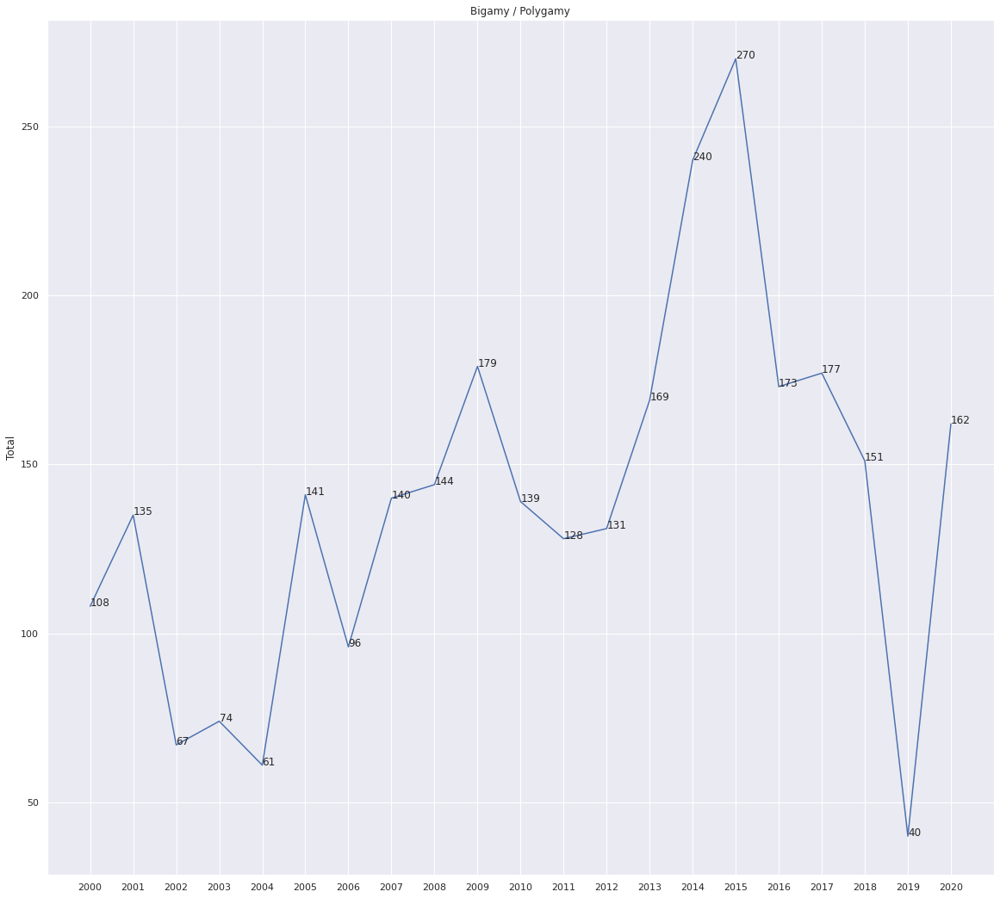

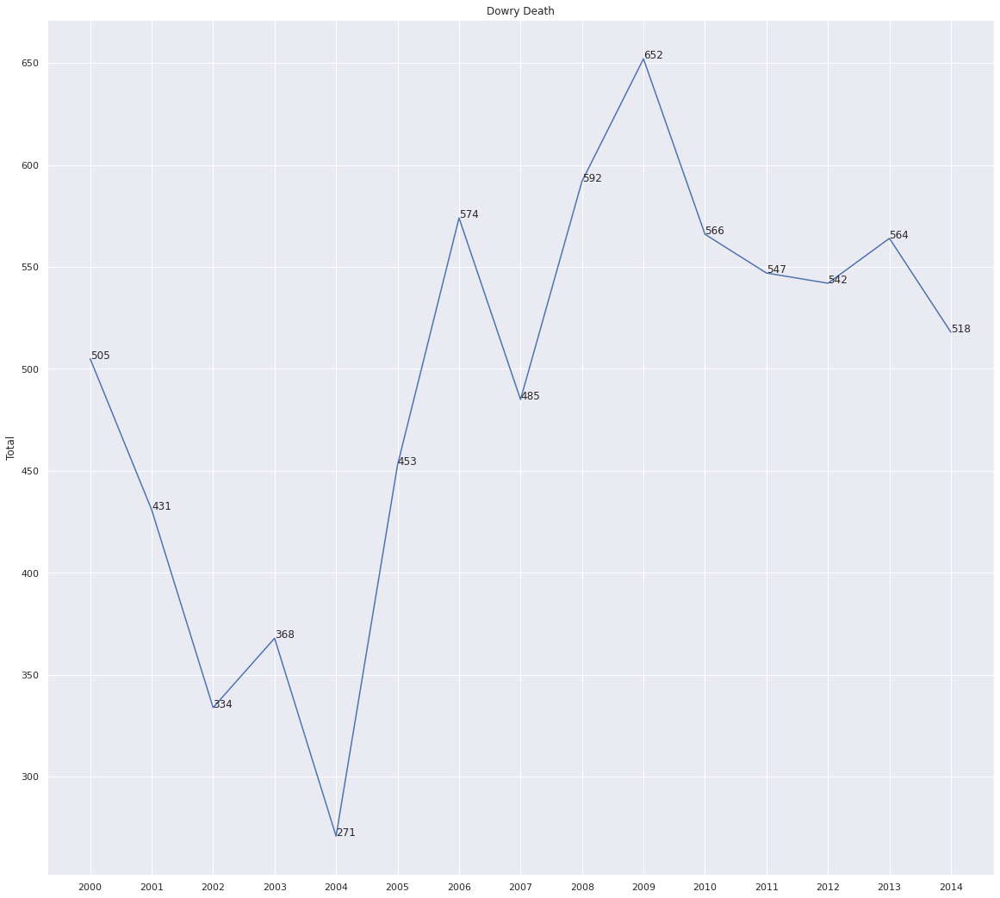

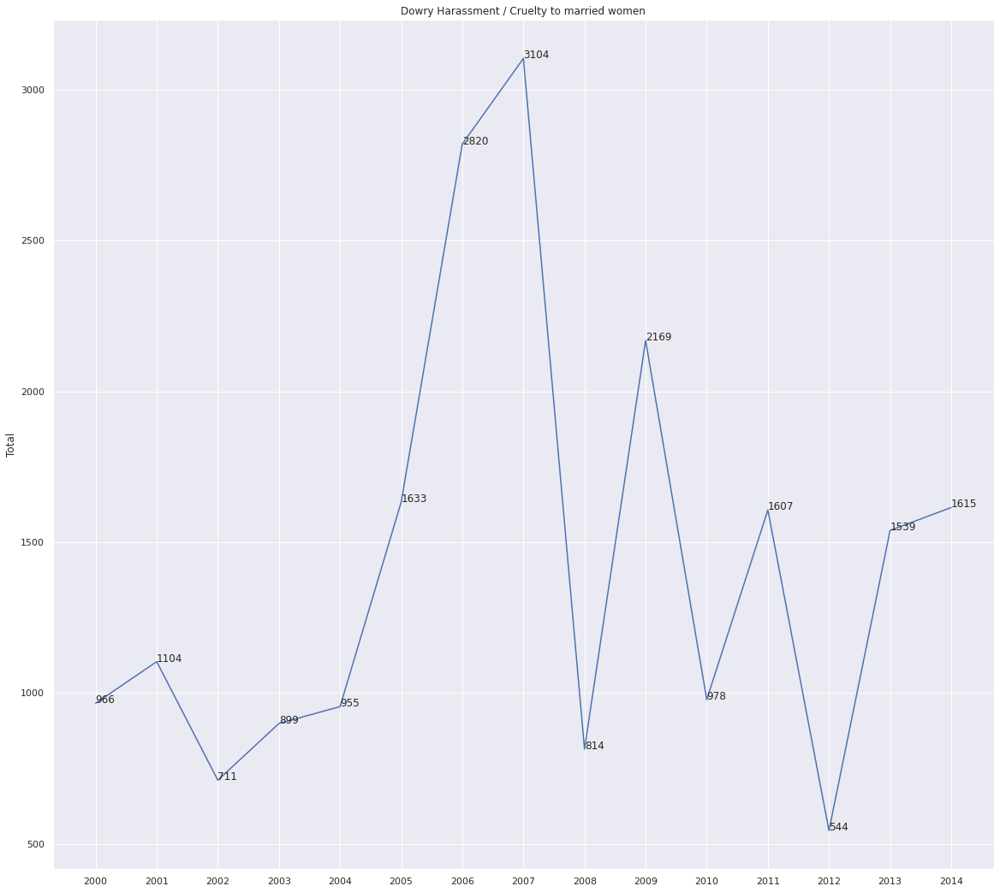

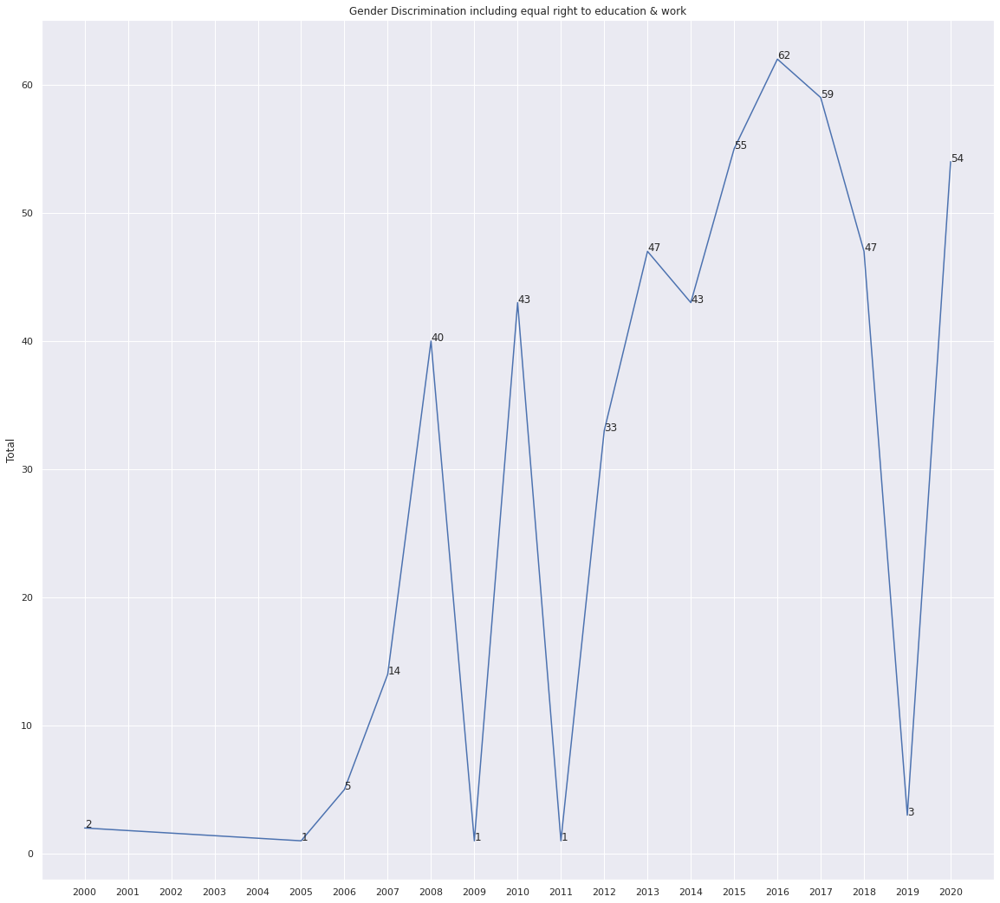

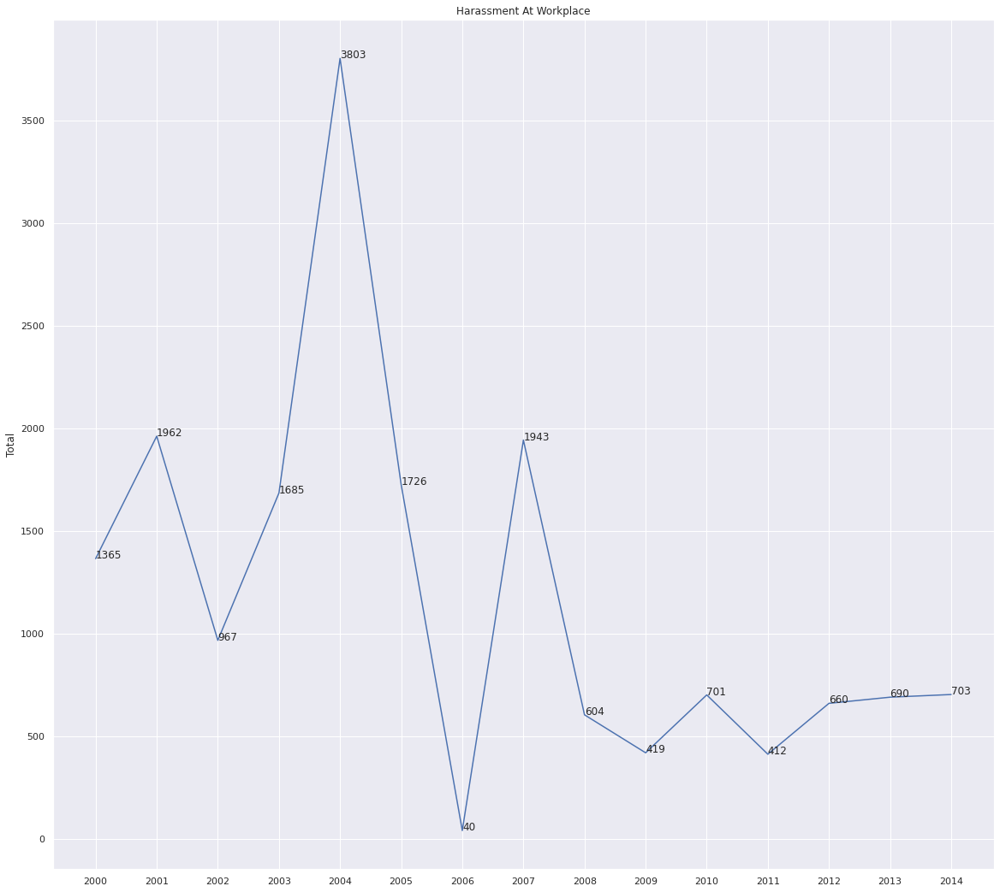

...

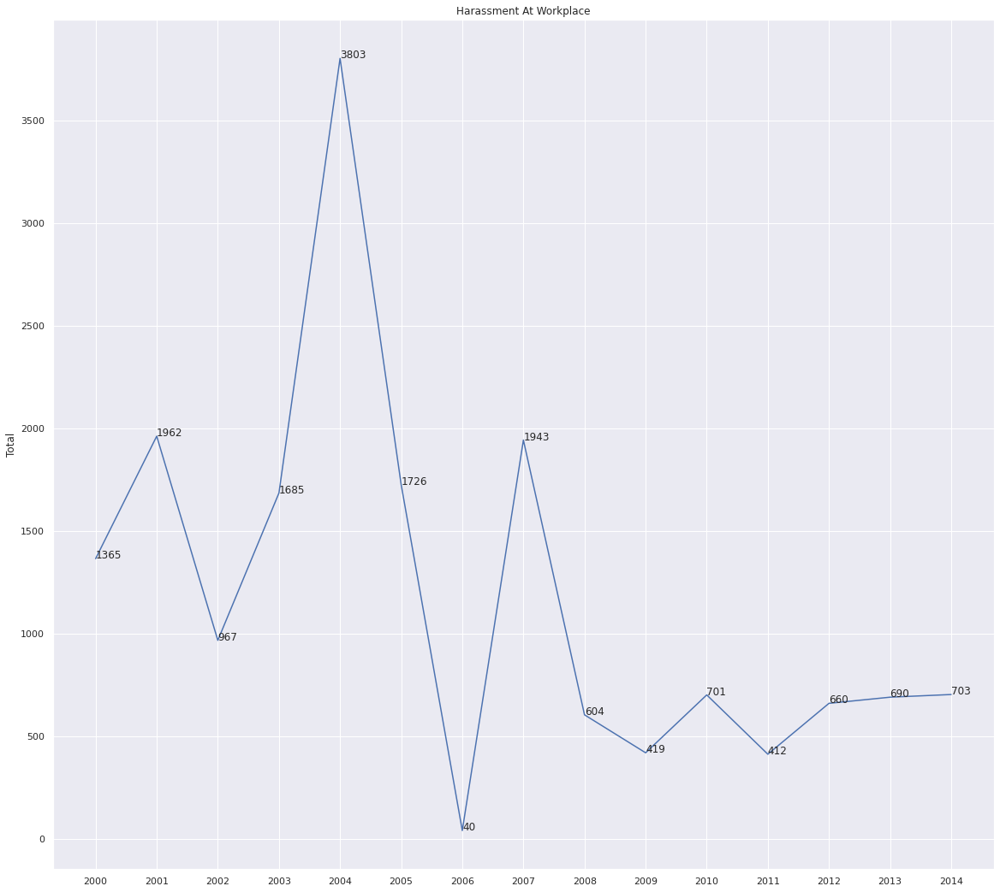

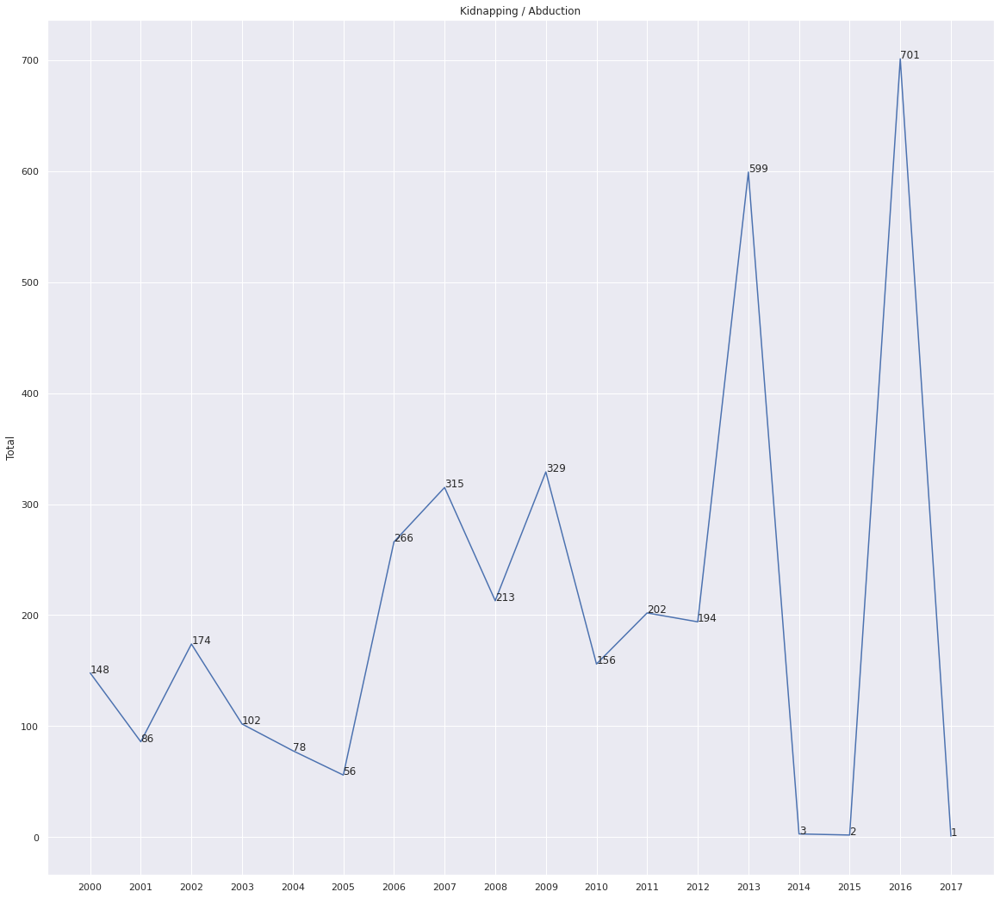

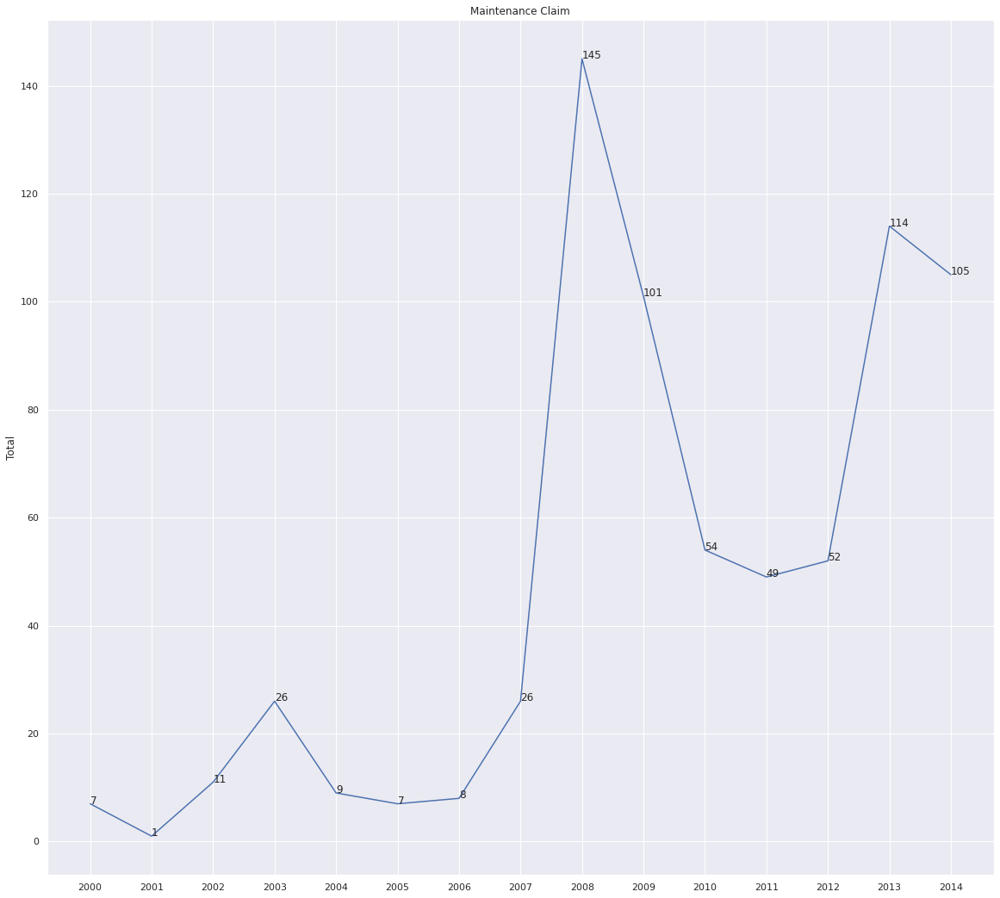

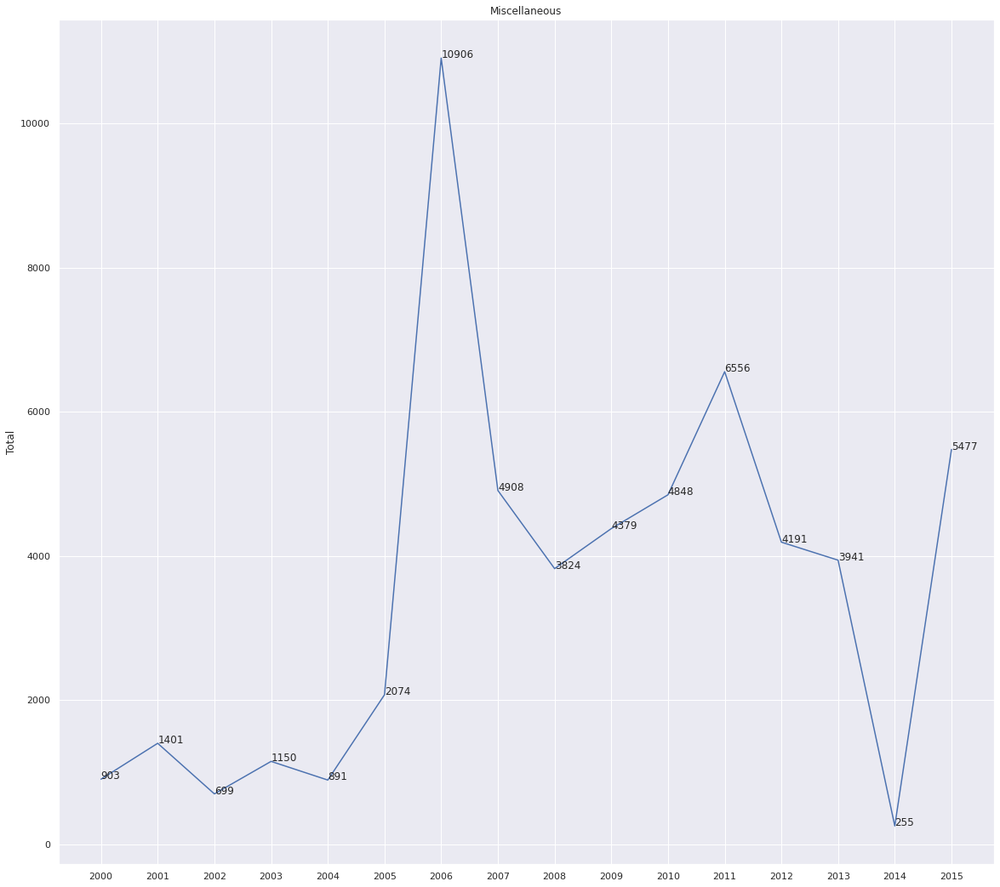

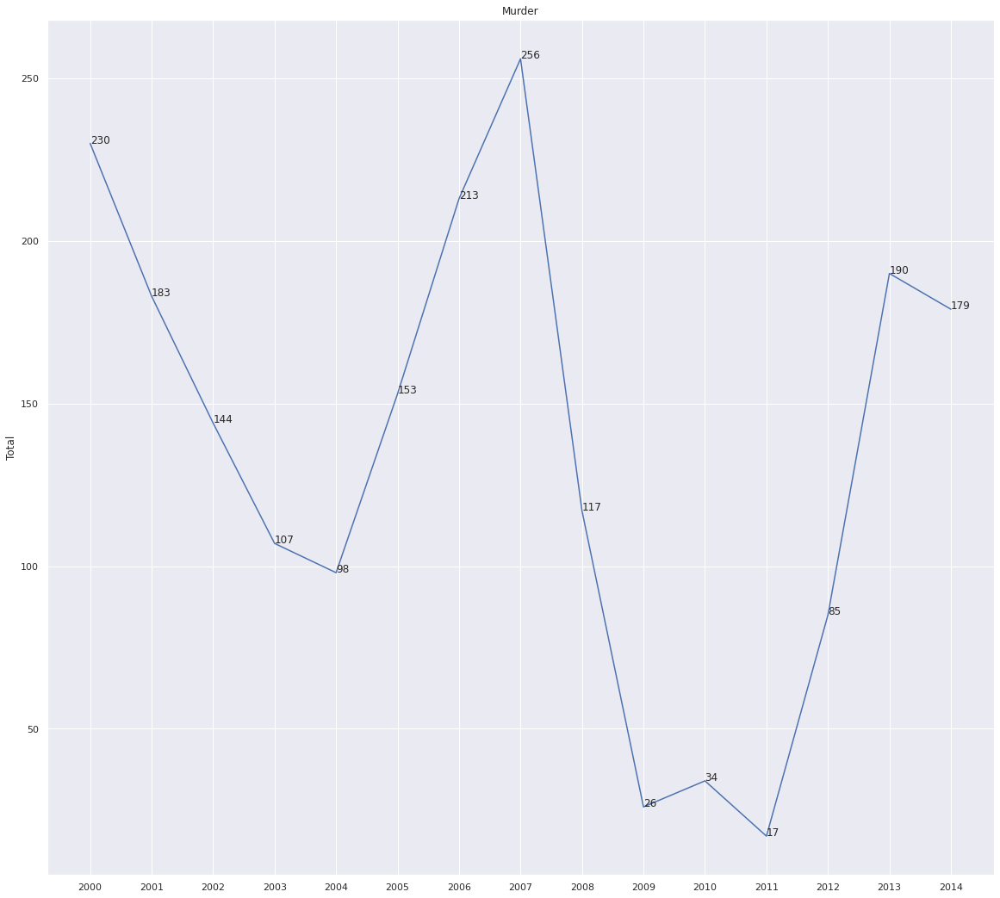

<Figure size 1418.4x1315.44 with 0 Axes>

In [8]:
!mkdir plots
plt.tight_layout()
r=1
c=1
for num in range(0,len(df.columns.to_list())):
    fig = plt.figure()

    y = df[df.columns[num]].iloc[-2].apply(int)
    x = df[df.columns[num]].iloc[-1].apply(int)
    x = x.to_list()
    x.sort()    
    
    if num%2==0:
        r+=1
        
    
    ax = fig.add_subplot(111) 
    for i,j in zip(x,y):
        ax.annotate(str(j),xy=(i,j))

    sns.lineplot(x=x,y=y)
    plt.title(df.columns[num])
    plt.xticks(np.arange(min(x), max(x)+1, 1.0))
#     plt.savefig('plots/'+str(df.columns[num])+'.jpg')

plt.show()

In [9]:
!zip -r year_wise.zip /kaggle/working/plots

  adding: kaggle/working/plots/ (stored 0%)


In [10]:
df = df.rename(columns={'Unnamed: 0':'Month'})

In [11]:
df

Nature,Bigamy / Polygamy,Dowry Death,Dowry Harassment / Cruelty to married women,Gender Discrimination including equal right to education & work,Harassment At Workplace,Kidnapping / Abduction,Maintenance Claim,Miscellaneous,Murder,Outraging Modesty of Women,...,Right to live with dignity,Right to live with dignity,Sex selective abortion / female foeticide / amniocentesis,Sexual harassment including sexual harassment at workplace,Sexual Harassment of Women at workplace,Stalking / Voyeurism,"Traditional practices derogatory to women rights i.e. sati pratha, devdasi pratha, witch hunting",Trafficking / Prostitution of women,Violence against women,Women's right of custody of children in the event of divorce
Jan,7,36,63,1,70,4,1,76,19,4,...,450,0,2,44,0,9,6,3,92,2
Feb,6,23,62,0,92,12,0,102,19,3,...,722,1,6,70,0,21,1,8,143,9
Mar,12,25,84,0,116,18,0,101,18,1,...,658,0,4,102,0,11,2,18,211,2
Apr,10,24,59,0,109,11,1,59,6,0,...,876,1,3,112,0,19,0,21,270,3
May,14,64,121,0,161,16,2,78,27,0,...,859,0,2,71,0,7,1,8,210,9
Jun,9,25,57,1,71,8,1,34,13,0,...,633,2,3,96,1,14,1,4,185,3
Jul,7,64,103,0,140,18,0,76,26,0,...,457,0,2,53,0,6,0,6,137,5
Aug,10,73,115,0,211,19,1,121,29,0,...,529,0,8,77,0,10,4,14,160,6
Sep,9,50,102,0,137,15,1,113,32,0,...,462,1,5,56,0,11,1,7,126,6
Oct,13,63,88,0,149,16,0,73,20,0,...,471,0,9,87,0,23,3,5,120,4


In [12]:
df2 = df.T

In [13]:
df2

,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,Total,Year
Nature,,,,,,,,,,,,,,
Bigamy / Polygamy,7,6,12,10,14,9,7,10,9,13,5,6,108,2000
Dowry Death,36,23,25,24,64,25,64,73,50,63,21,37,505,2000
Dowry Harassment / Cruelty to married women,63,62,84,59,121,57,103,115,102,88,54,58,966,2000
Gender Discrimination including equal right to education & work,1,0,0,0,0,1,0,0,0,0,0,0,2,2000
Harassment At Workplace,70,92,116,109,161,71,140,211,137,149,40,69,1365,2000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Stalking / Voyeurism,9,21,11,19,7,14,6,10,11,23,17,10,158,2018
"Traditional practices derogatory to women rights i.e. sati pratha, devdasi pratha, witch hunting",6,1,2,0,1,1,0,4,1,3,3,0,22,2018
Trafficking / Prostitution of women,3,8,18,21,8,4,6,14,7,5,23,4,121,2018


# Yearwise DataFrames
* 2020
* 2019
* 2018
* 2017
* 2000
* 2010

In [14]:
df2020 = df2.loc[(df2.Year==2020)|(df2.Year=='2020'),:]

In [15]:
df2020

,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,Total,Year
Nature,,,,,,,,,,,,,,
Acid Attack,1,2,0,0,0,0,0,0,0,0,0,0,3,2020
Bigamy / Polygamy,10,7,6,6,11,0,0,0,0,0,0,0,40,2020
Cyber Crime against women,32,21,37,55,57,0,0,0,0,0,0,0,202,2020
Denial of Maternity Benefits to women,9,10,13,2,6,0,0,0,0,0,0,0,40,2020
Dowry death,32,17,18,9,17,0,0,0,0,0,0,0,93,2020
Free legal aid for women,5,7,4,0,3,0,0,0,0,0,0,0,19,2020
Gender Discrimination including equal right to education & work,1,0,0,1,1,0,0,0,0,0,0,0,3,2020
Harassment of married women/Dowry harassment,267,221,203,62,105,0,0,0,0,0,0,0,858,2020
Indecent Representation of Women,2,1,1,1,5,0,0,0,0,0,0,0,10,2020


In [16]:
df2019 = df2.loc[(df2.Year==2019)|(df2.Year=='2019'),:]

In [17]:
df2019

,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,Total,Year
Nature,,,,,,,,,,,,,,
Acid Attack,4,4,0,1,2,1,1,4,0,1,0,2,20,2019
Bigamy / Polygamy,18,11,11,14,12,10,11,14,11,9,9,21,151,2019
Cyber Crime against women,39,30,22,35,49,33,43,61,40,35,35,37,459,2019
Denial of Maternity Benefits to women,3,16,7,8,10,5,11,10,12,19,12,23,136,2019
Dowry death,14,22,16,13,46,14,31,49,56,38,32,42,373,2019
Free legal aid for women,36,27,11,16,15,11,26,7,10,13,12,5,189,2019
Gender Discrimination including equal right to education & work,5,2,4,7,6,3,3,6,5,3,2,1,47,2019
Harassment of married women/Dowry harassment,207,200,204,228,397,316,361,468,468,391,368,275,3883,2019
Indecent Representation of Women,2,7,6,7,10,11,14,11,13,7,7,9,104,2019


In [18]:
df2018 = df2.loc[(df2.Year==2018)|(df2.Year=='2018'),:]
df2018

,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,Total,Year
Nature,,,,,,,,,,,,,,
Bigamy / Polygamy,8,8,26,21,13,17,11,10,11,8,20,9,162,2018
Cyber Crime against women,26,24,14,41,35,33,31,47,33,26,36,29,375,2018
Denial of Maternity Benefits to women,0,0,0,0,0,0,0,0,0,0,1,0,1,2018
Dowry harassment / dowry death,146,200,316,402,296,305,236,235,233,208,502,167,3246,2018
Free legal aid for women,27,22,23,49,29,35,22,26,10,17,52,34,346,2018
Gender Discrimination including equal right to education & work,2,2,4,6,0,9,4,5,6,5,5,6,54,2018
Harassment of married women/Dowry harassment,0,0,0,0,0,1,0,0,0,1,1,0,3,2018
Indecent Representation of Women,5,11,5,11,2,14,6,16,4,10,12,7,103,2018
Outraging Modesty of Women,49,109,68,104,133,107,76,61,73,92,236,57,1165,2018


In [19]:
df2017 = df2.loc[(df2.Year==2017)|(df2.Year=='2017'),:]
df2017

,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,Total,Year
Nature,,,,,,,,,,,,,,
Bigamy / Polygamy,12,10,26,9,17,20,16,14,6,9,18,16,173,2017
Cyber Crime against women,28,23,44,22,45,24,44,23,29,13,45,30,370,2017
Dowry harassment / dowry death,168,146,177,156,278,194,221,158,169,103,259,171,2200,2017
Free legal aid for women,5,15,20,15,26,15,13,46,28,25,41,16,265,2017
Gender Discrimination including equal right to education & work,3,3,8,3,5,2,3,3,14,2,8,1,55,2017
Indecent Representation of Women,6,11,8,5,12,4,16,5,12,7,19,7,112,2017
Kidnapping / Abduction,0,1,0,1,0,0,0,0,0,0,0,0,2,2017
Outraging Modesty of Women,62,66,63,63,70,79,117,84,71,57,104,101,937,2017
Police Apathy against women,318,212,308,253,227,204,192,110,106,83,150,144,2307,2017


In [20]:
df2000 = df2.loc[(df2.Year==2000)|(df2.Year=='2000'),:]
df2000

,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,Total,Year
Nature,,,,,,,,,,,,,,
Bigamy / Polygamy,7,6,12,10,14,9,7,10,9,13,5,6,108,2000
Dowry Death,36,23,25,24,64,25,64,73,50,63,21,37,505,2000
Dowry Harassment / Cruelty to married women,63,62,84,59,121,57,103,115,102,88,54,58,966,2000
Gender Discrimination including equal right to education & work,1,0,0,0,0,1,0,0,0,0,0,0,2,2000
Harassment At Workplace,70,92,116,109,161,71,140,211,137,149,40,69,1365,2000
Kidnapping / Abduction,4,12,18,11,16,8,18,19,15,16,4,7,148,2000
Maintenance Claim,1,0,0,1,2,1,0,1,1,0,0,0,7,2000
Miscellaneous,76,102,101,59,78,34,76,121,113,73,18,52,903,2000
Murder,19,19,18,6,27,13,26,29,32,20,10,11,230,2000


In [21]:
df2010 = df2.loc[(df2.Year==2010)|(df2.Year=='2010'),:]
df2010

,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,Total,Year
Nature,,,,,,,,,,,,,,
Acid Attack,0,0,0,0,1,0,1,0,0,0,0,2,4,2010
Attempt To Murder,0,0,5,6,5,7,4,6,10,6,9,7,65,2010
Attempt To Rape,16,13,5,24,40,16,14,16,10,10,13,31,208,2010
Bigamy / Polygamy,10,5,14,13,13,14,13,11,9,11,13,13,139,2010
Complaint Against NRIs/ NRI Marriages,0,0,0,0,0,0,0,1,1,0,0,1,3,2010
Cyber Crime against women,1,2,2,1,6,4,5,3,5,3,0,6,38,2010
Deprivation of Property Rights,79,29,72,153,137,107,99,91,51,81,78,157,1134,2010
Divorce,2,5,8,8,9,9,2,4,3,4,6,7,67,2010
Dowry Death,42,24,47,55,72,59,49,46,32,42,42,56,566,2010


In [22]:
!mkdir year_frames
df2020.to_csv('year_frames/df2020.csv')
df2019.to_csv('year_frames/df2019.csv')
df2018.to_csv('year_frames/df2018.csv')
df2017.to_csv('year_frames/df2017.csv')
df2000.to_csv('year_frames/df2000.csv')
df2010.to_csv('year_frames/df2010.csv')
!zip -r year_frames.zip year_frames

  adding: year_frames/ (stored 0%)
  adding: year_frames/df2000.csv (deflated 46%)
  adding: year_frames/df2020.csv (deflated 54%)
  adding: year_frames/df2019.csv (deflated 49%)
  adding: year_frames/df2017.csv (deflated 47%)
  adding: year_frames/df2010.csv (deflated 48%)
  adding: year_frames/df2018.csv (deflated 50%)


# EDA Start

In [23]:
years_list = [2000,2010,2017,2018,2019]

In [24]:
df2000 = pd.read_csv('/kaggle/input/omdena-naturewise/df2000.csv')
df2010 = pd.read_csv('/kaggle/input/omdena-naturewise/df2010.csv')
df2017 = pd.read_csv('/kaggle/input/omdena-naturewise/df2017.csv')
df2018 = pd.read_csv('/kaggle/input/omdena-naturewise/df2018.csv')
df2019 = pd.read_csv('/kaggle/input/omdena-naturewise/df2019.csv')
df2020 = pd.read_csv('/kaggle/input/omdena-naturewise/df2020.csv')

In [25]:
df2020 = df2020.rename(columns={df2020.columns[0]:'class'}).iloc[1:-1]
df2019 = df2019.rename(columns={df2019.columns[0]:'class'}).iloc[1:-1]
df2018 = df2018.rename(columns={df2018.columns[0]:'class'}).iloc[1:-1]
df2017 = df2017.rename(columns={df2017.columns[0]:'class'}).iloc[1:-1]
df2010 = df2010.rename(columns={df2010.columns[0]:'class'}).iloc[1:-1]
df2000 = df2000.rename(columns={df2000.columns[0]:'class'}).iloc[1:-1]



In [26]:
df2020

,class,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,Total,Year
1,Acid Attack.9,1,2,0,0,0,0,0,0,0,0,0,0,3,2020
2,Bigamy or Polygamy.19,10,7,6,6,11,0,0,0,0,0,0,0,40,2020
3,Cyber Crime against women.14,32,21,37,55,57,0,0,0,0,0,0,0,202,2020
4,Denial of Maternity Benefits to women.1,9,10,13,2,6,0,0,0,0,0,0,0,40,2020
5,Dowry death.1,32,17,18,9,17,0,0,0,0,0,0,0,93,2020
6,Free legal aid for women.6,5,7,4,0,3,0,0,0,0,0,0,0,19,2020
7,Gender Discrimination including equal right to...,1,0,0,1,1,0,0,0,0,0,0,0,3,2020
8,Harassment of married womenorDowry harassment.2,267,221,203,62,105,0,0,0,0,0,0,0,858,2020
9,Indecent Representation of Women.8,2,1,1,1,5,0,0,0,0,0,0,0,10,2020
10,Not Categorized yet,0,0,0,3,62,0,0,0,0,0,0,0,65,2020


In [27]:
df2019

,class,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,Total,Year
1,Acid Attack.8,4,4,0,1,2,1,1,4,0,1,0,2,20,2019
2,Bigamy or Polygamy.18,18,11,11,14,12,10,11,14,11,9,9,21,151,2019
3,Cyber Crime against women.13,39,30,22,35,49,33,43,61,40,35,35,37,459,2019
4,Denial of Maternity Benefits to women,3,16,7,8,10,5,11,10,12,19,12,23,136,2019
5,Dowry death,14,22,16,13,46,14,31,49,56,38,32,42,373,2019
6,Free legal aid for women.5,36,27,11,16,15,11,26,7,10,13,12,5,189,2019
7,Gender Discrimination including equal right to...,5,2,4,7,6,3,3,6,5,3,2,1,47,2019
8,Harassment of married womenorDowry harassment.1,207,200,204,228,397,316,361,468,468,391,368,275,3883,2019
9,Indecent Representation of Women.7,2,7,6,7,10,11,14,11,13,7,7,9,104,2019
10,Outraging modesty of womenorMolestation.1,62,68,59,70,150,108,132,198,165,102,105,101,1320,2019


In [28]:
df2018

,class,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,Total,Year
1,Bigamy or Polygamy.20,8,8,26,21,13,17,11,10,11,8,20,9,162,2018
2,Cyber Crime against women.15,26,24,14,41,35,33,31,47,33,26,36,29,375,2018
3,Denial of Maternity Benefits to women.2,0,0,0,0,0,0,0,0,0,0,1,0,1,2018
4,Dowry harassment or dowry death.5,146,200,316,402,296,305,236,235,233,208,502,167,3246,2018
5,Free legal aid for women.7,27,22,23,49,29,35,22,26,10,17,52,34,346,2018
6,Gender Discrimination including equal right to...,2,2,4,6,0,9,4,5,6,5,5,6,54,2018
7,Harassment of married womenorDowry harassment.3,0,0,0,0,0,1,0,0,0,1,1,0,3,2018
8,Indecent Representation of Women.9,5,11,5,11,2,14,6,16,4,10,12,7,103,2018
9,Outraging Modesty of Women.18,49,109,68,104,133,107,76,61,73,92,236,57,1165,2018
10,Police Apathy against women.20,103,110,223,244,201,181,96,166,161,193,588,223,2489,2018


In [29]:
df2017

,class,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,Total,Year
1,Bigamy or Polygamy.16,12,10,26,9,17,20,16,14,6,9,18,16,173,2017
2,Cyber Crime against women.10,28,23,44,22,45,24,44,23,29,13,45,30,370,2017
3,Dowry harassment or dowry death.2,168,146,177,156,278,194,221,158,169,103,259,171,2200,2017
4,Free legal aid for women.2,5,15,20,15,26,15,13,46,28,25,41,16,265,2017
5,Gender Discrimination including equal right to...,3,3,8,3,5,2,3,3,14,2,8,1,55,2017
6,Indecent Representation of Women.4,6,11,8,5,12,4,16,5,12,7,19,7,112,2017
7,Kidnapping or Abduction.15,0,1,0,1,0,0,0,0,0,0,0,0,2,2017
8,Outraging Modesty of Women.15,62,66,63,63,70,79,117,84,71,57,104,101,937,2017
9,Police Apathy against women.15,318,212,308,253,227,204,192,110,106,83,150,144,2307,2017
10,Privacy of women and rights thereof.1,7,8,18,5,17,10,14,13,14,14,26,5,151,2017


In [30]:
df2010

,class,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,Total,Year
1,Acid Attack.3,0,0,0,0,1,0,1,0,0,0,0,2,4,2010
2,Attempt To Murder.3,0,0,5,6,5,7,4,6,10,6,9,7,65,2010
3,Attempt To Rape.3,16,13,5,24,40,16,14,16,10,10,13,31,208,2010
4,Bigamy or Polygamy.10,10,5,14,13,13,14,13,11,9,11,13,13,139,2010
5,Complaint Against NRIsor NRI Marriages.4,0,0,0,0,0,0,0,1,1,0,0,1,3,2010
6,Cyber Crime against women.5,1,2,2,1,6,4,5,3,5,3,0,6,38,2010
7,Deprivation of Property Rights.4,79,29,72,153,137,107,99,91,51,81,78,157,1134,2010
8,Divorce.8,2,5,8,8,9,9,2,4,3,4,6,7,67,2010
9,Dowry Death.10,42,24,47,55,72,59,49,46,32,42,42,56,566,2010
10,Dowry Harassment or Cruelty to married women.10,118,52,102,141,117,102,72,79,54,55,34,52,978,2010


In [31]:

# print(set(df2020['class'].to_list()) - set(df2019['class'].to_list()))
# print(set(df2020['class'].to_list()) - set(df2018['class'].to_list()))
# print(set(df2020['class'].to_list()) - set(df2017['class'].to_list()))
# print(set(df2020['class'].to_list()) - set(df2010['class'].to_list()))
# print(set(df2020['class'].to_list()) - set(df2000['class'].to_list()))

# Dowry

In [32]:
!mkdir eda_plots
!mkdir eda_plots/dowry

In [33]:
df2020.columns[1:-2].to_list()

['Jan',
 'Feb',
 'Mar',
 'Apr',
 'May',
 'Jun',
 'Jul',
 'Aug',
 'Sep',
 'Oct',
 'Nov',
 'Dec']

In [34]:
#2020
dowry2020 = list(map(int,df2020.iloc[4].to_list()[1:-2]))
dowry_harassment2020= list(map(int,df2020.iloc[7].to_list()[1:-2]))
#2019
dowry2019 = list(map(int,df2019.iloc[4].to_list()[1:-2]))
dowry_harassment2019= list(map(int,df2019.iloc[7].to_list()[1:-2]))

#2010
dowry2010 = list(map(int,df2010.iloc[8].to_list()[1:-2]))
dowry_harassment2010= list(map(int,df2010.iloc[9].to_list()[1:-2]))

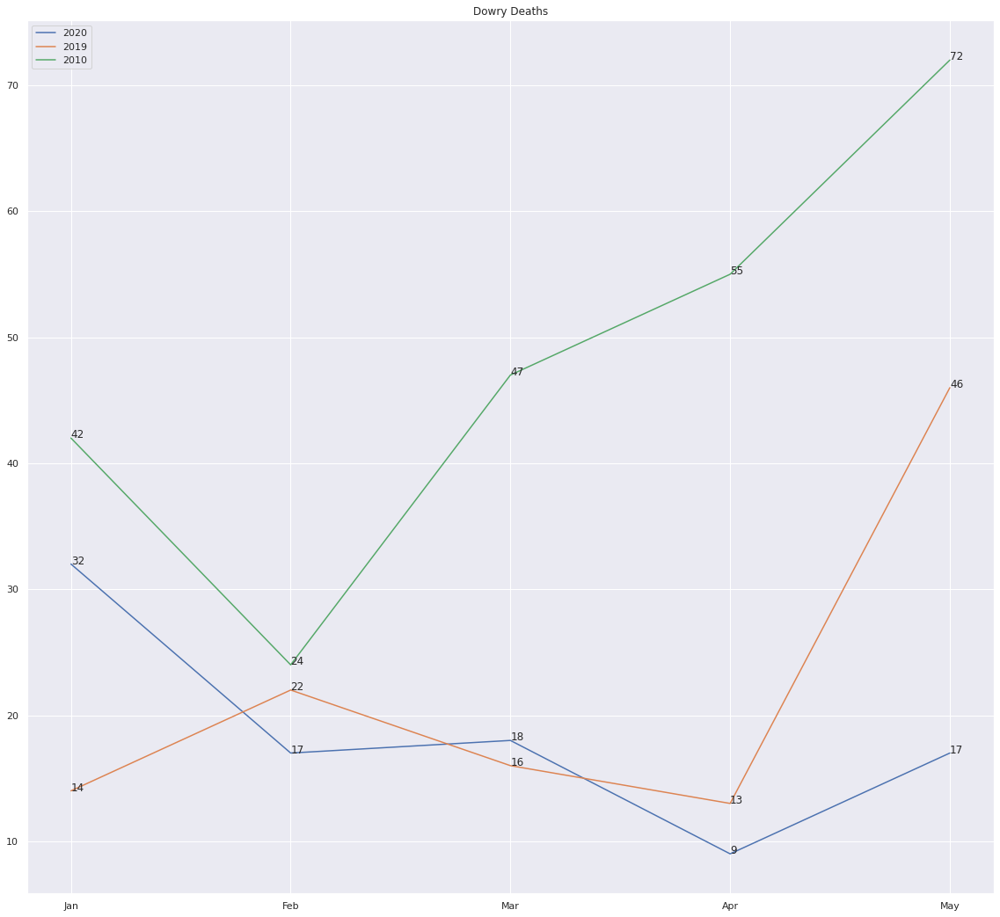

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt
x=df2020.columns[1:-2].to_list()[:5]
y=dowry2020[:5]
fig = plt.figure()    
ax = fig.add_subplot(111) 
for i,j in zip(x,y):
    ax.annotate(str(j),xy=(i,j))

plt.plot(x,y,label='2020')

#2019

x=df2019.columns[1:-2].to_list()[:5]
y=dowry2019[:5]
# fig = plt.figure()    
ax = fig.add_subplot(111) 
for i,j in zip(x,y):
    ax.annotate(str(j),xy=(i,j))
plt.title('Dowry Deaths')

plt.plot(x,y,label='2019')

#2010

x=df2010.columns[1:-2].to_list()[:5]
y=dowry2010[:5]
# fig = plt.figure()    
ax = fig.add_subplot(111) 
for i,j in zip(x,y):
    ax.annotate(str(j),xy=(i,j))
plt.title('Dowry Deaths')

plt.plot(x,y,label='2010')
plt.legend(loc='upper left')
# plt.savefig('eda_plots/dowry/dowry_deaths.jpg')
plt.show()

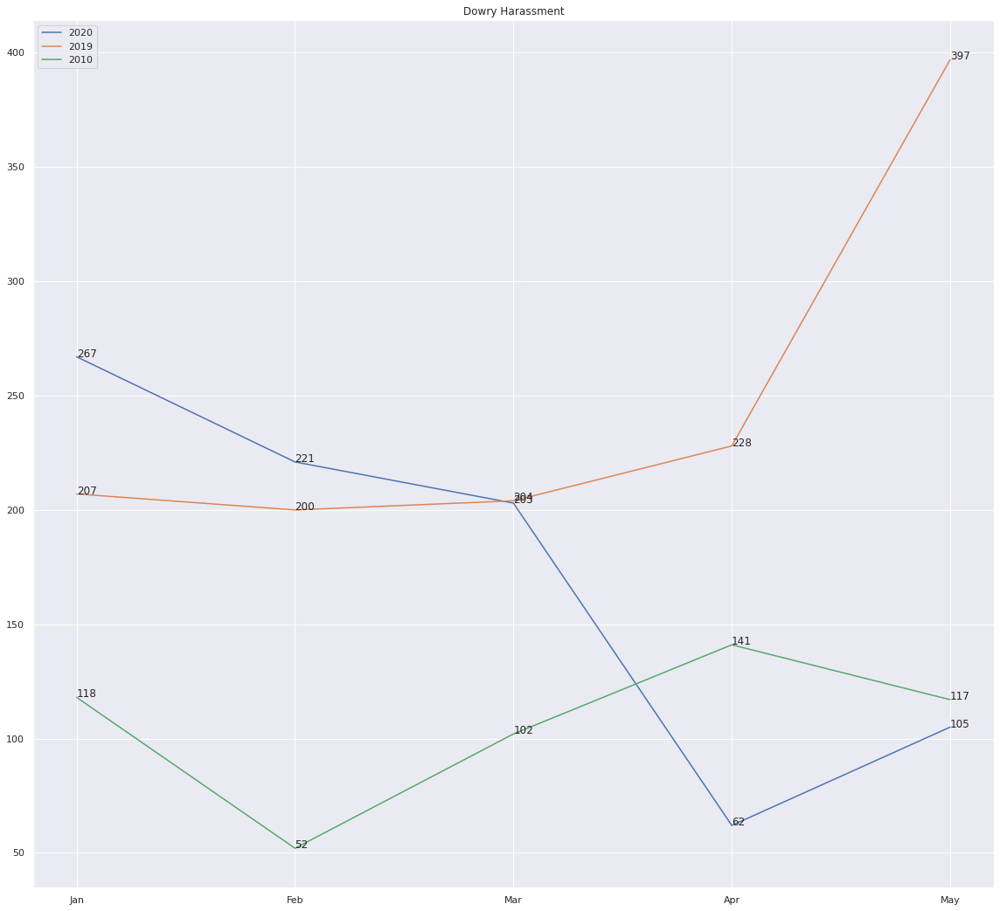

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt
x=df2020.columns[1:-2].to_list()[:5]
y=dowry_harassment2020[:5]
fig = plt.figure()    
ax = fig.add_subplot(111) 
for i,j in zip(x,y):
    ax.annotate(str(j),xy=(i,j))

plt.plot(x,y,label='2020')

#2019

x=df2019.columns[1:-2].to_list()[:5]
y=dowry_harassment2019[:5]
# fig = plt.figure()    
ax = fig.add_subplot(111) 
for i,j in zip(x,y):
    ax.annotate(str(j),xy=(i,j))


plt.plot(x,y,label='2019')

#2010

x=df2010.columns[1:-2].to_list()[:5]
y=dowry_harassment2010[:5]
# fig = plt.figure()    
ax = fig.add_subplot(111) 
for i,j in zip(x,y):
    ax.annotate(str(j),xy=(i,j))
plt.title('Dowry Harassment')

plt.plot(x,y,label='2010')
plt.legend(loc='upper left')
# plt.savefig('eda_plots/dowry/dowry_harassment.jpg')
plt.show()

In [37]:
from scipy.stats import pearsonr
print(dowry2020)
print(dowry_harassment2020)
print(f'Correlation between dowry harassment and dowry deaths in 2020 was {pearsonr(dowry_harassment2020,dowry2020)[0]*100}%')
print()

print(dowry2019)
print(dowry_harassment2019)
print(f'Correlation between dowry harassment and dowry deaths in 2019 was {pearsonr(dowry_harassment2019,dowry2019)[0]*100}%')
print()

print(dowry2010)
print(dowry_harassment2010)
print(f'Correlation between dowry harassment and dowry deaths in 2010 was {pearsonr(dowry_harassment2010,dowry2010)[0]*100}%')


[32, 17, 18, 9, 17, 0, 0, 0, 0, 0, 0, 0]
[267, 221, 203, 62, 105, 0, 0, 0, 0, 0, 0, 0]
Correlation between dowry harassment and dowry deaths in 2020 was 95.83430852567228%

[14, 22, 16, 13, 46, 14, 31, 49, 56, 38, 32, 42]
[207, 200, 204, 228, 397, 316, 361, 468, 468, 391, 368, 275]
Correlation between dowry harassment and dowry deaths in 2019 was 83.82468209412804%

[42, 24, 47, 55, 72, 59, 49, 46, 32, 42, 42, 56]
[118, 52, 102, 141, 117, 102, 72, 79, 54, 55, 34, 52]
Correlation between dowry harassment and dowry deaths in 2010 was 55.70013433802907%


In [38]:
!zip -r eda_plots.zip eda_plots

  adding: eda_plots/ (stored 0%)
  adding: eda_plots/dowry/ (stored 0%)
